In [79]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import misc
from sklearn import tree
import pydotplus
from IPython.display import Image

#from sklearn.cross_validation import train_test_split, cross_val_score
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, KFold
from sklearn.model_selection import GridSearchCV
from sklearn.externals.six import StringIO
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, export_graphviz
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, BaggingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import confusion_matrix, classification_report, mean_squared_error, accuracy_score

%matplotlib inline

pd.set_option('display.notebook_repr_html', True)

In [80]:
#读取数据
data = pd.read_csv('data.csv')

In [81]:
#数据探查
data.head()


,NO,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys


In [82]:
##### 数据探查
print "data.shape:",data.shape
print "data.columns:",data.dtypes

#标注正样本和负样本
data_pos=data[data['target']==1]
print data_pos['target'].value_counts()
data_neg=data[data['target']==0]
print data_neg['target'].value_counts()

data.shape: (2017, 17)
data.columns: NO                    int64
acousticness        float64
danceability        float64
duration_ms           int64
energy              float64
instrumentalness    float64
key                   int64
liveness            float64
loudness            float64
mode                  int64
speechiness         float64
tempo               float64
time_signature      float64
valence             float64
target                int64
song_title           object
artist               object
dtype: object
1    1020
Name: target, dtype: int64
0    997
Name: target, dtype: int64


* 包含17个字段，target表示喜欢有否
* 正负样本比较均衡，不用做特殊处理


17个字段的解释如下：

（来源：：https://developer.spotify.com/web-api/get-audio-features/ ）

* acousticness        float64,原声音乐
* danceability        float64,表示该首个歌曲的节奏是否符合跳舞
* duration_ms           int64,持续时长
* energy              float64,对一首歌曲感性和活跃性的度量值
* instrumentalness    float64,是否没有人声（越大，无人声越严重）
* key                   int64,音乐key值的编号
* liveness            float64,活跃性
* loudness            float64,声音大小
* mode                  int64,是否主流旋律
* speechiness         float64,口语化程度
* tempo               float64,节奏感（beats per minute）
* time_signature      float64,每小节有多少个节拍
* valence             float64,欢快还是悲伤（1——>0）
* target                int64,
* song_title           object,歌曲名称
* artist               object,艺术家


In [83]:
### 特征可视化

#查看特征空间分布
pos_acousticness = data[data['target'] == 1]['acousticness']
neg_acousticness = data[data['target'] == 0]['acousticness']
pos_dance = data[data['target'] == 1]['danceability']
neg_dance = data[data['target'] == 0]['danceability']
pos_duration = data[data['target'] == 1]['duration_ms']
neg_duration = data[data['target'] == 0]['duration_ms']
pos_energy = data[data['target'] == 1]['energy']
neg_energy = data[data['target'] == 0]['energy']
pos_instrumentalness = data[data['target'] == 1]['instrumentalness']
neg_instrumentalness = data[data['target'] == 0]['instrumentalness']
pos_key = data[data['target'] == 1]['key']
neg_key = data[data['target'] == 0]['key']
#
pos_liveness = data[data['target'] == 1]['liveness']
neg_liveness = data[data['target'] == 0]['liveness']
pos_loudness = data[data['target'] == 1]['loudness']
neg_loudness = data[data['target'] == 0]['loudness']
#
pos_mode = data[data['target'] == 1]['mode']
neg_mode = data[data['target'] == 0]['mode']
pos_speechiness = data[data['target'] == 1]['speechiness']
neg_speechiness = data[data['target'] == 0]['speechiness']
#
pos_tempo = data[data['target'] == 1]['tempo']
neg_tempo = data[data['target'] == 0]['tempo']
#
pos_time_signature = data[data['target'] == 1]['time_signature']
neg_time_signature = data[data['target'] == 0]['time_signature']
pos_valence = data[data['target'] == 1]['valence']
neg_valence = data[data['target'] == 0]['valence']

#这里没有对歌曲名称进行可以化，由于是自然语言，不便于可视化处理
#对艺术家的展示在接下来展示


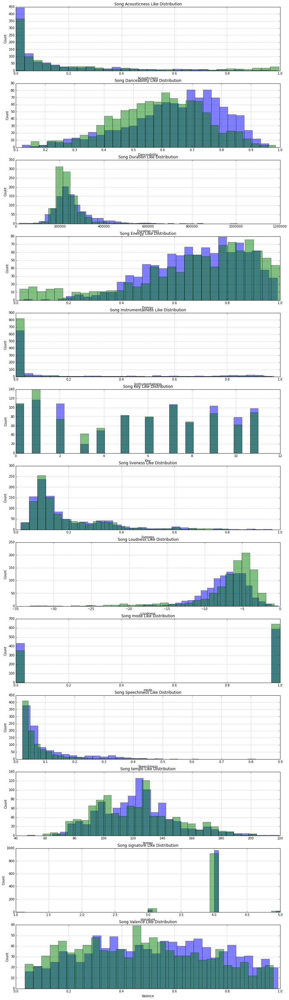

In [84]:

# In[15]:

fig2 = plt.figure(figsize=(15,60))


# Acousticness
ax1 = fig2.add_subplot(14,1,1)
pos_acousticness.hist(alpha=0.5, bins=30)
neg_acousticness.hist(alpha=0.5, bins=30)
ax1.set_xlabel('Acousticness')
ax1.set_ylabel('Count')
ax1.set_title("Song Acousticness Like Distribution")

# Danceability
ax2 = fig2.add_subplot(14,1,2)
pos_dance.hist(alpha=0.5, bins=30)
neg_dance.hist(alpha=0.5, bins=30)
ax2.set_xlabel('Danceability')
ax2.set_ylabel('Count')
ax2.set_title("Song Danceability Like Distribution")

# Duration
ax3 = fig2.add_subplot(14,1,3)
pos_duration.hist(alpha=0.5, bins=30)
neg_duration.hist(alpha=0.5, bins=30)
ax3.set_xlabel('Duration (ms)')
ax3.set_ylabel('Count')
ax3.set_title("Song Duration Like Distribution")

# Energy
ax4 = fig2.add_subplot(14,1,4)
pos_energy.hist(alpha=0.5, bins=30)
neg_energy.hist(alpha=0.5, bins=30)
ax4.set_xlabel('Energy')
ax4.set_ylabel('Count')
ax4.set_title("Song Energy Like Distribution")

# Instrumentalness
ax5 = fig2.add_subplot(14,1,5)
pos_instrumentalness.hist(alpha=0.5, bins=30)
neg_instrumentalness.hist(alpha=0.5, bins=30)
ax5.set_xlabel('Instrumentalness')
ax5.set_ylabel('Count')
ax5.set_title("Song Instrumentalness Like Distribution")

# Key
ax6 = fig2.add_subplot(14,1,6)
pos_key.hist(alpha=0.5, bins=30)
neg_key.hist(alpha=0.5, bins=30)
ax6.set_xlabel('Key')
ax6.set_ylabel('Count')
ax6.set_title("Song Key Like Distribution")

#liveness
ax7 = fig2.add_subplot(14,1,7)
pos_liveness.hist(alpha=0.5, bins=30)
neg_liveness.hist(alpha=0.5, bins=30)
ax7.set_xlabel('liveness')
ax7.set_ylabel('Count')
ax7.set_title("Song liveness Like Distribution")


# Loudness
ax8 = fig2.add_subplot(14,1,8)
pos_loudness.hist(alpha=0.5, bins=30)
neg_loudness.hist(alpha=0.5, bins=30)
ax8.set_xlabel('Loudness')
ax8.set_ylabel('Count')
ax8.set_title("Song Loudness Like Distribution")

# mode
ax9 = fig2.add_subplot(14,1,9)
pos_mode.hist(alpha=0.5, bins=30)
neg_mode.hist(alpha=0.5, bins=30)
ax9.set_xlabel('mode')
ax9.set_ylabel('Count')
ax9.set_title("Song mode Like Distribution")

# Speechiness
ax10 = fig2.add_subplot(14,1,10)
pos_speechiness.hist(alpha=0.5, bins=30)
ax10.set_xlabel('Speechiness')
ax10.set_ylabel('Count')
ax10.set_title("Song Speechiness Like Distribution")
neg_speechiness.hist(alpha=0.5, bins=30)


# Speechiness
ax11 = fig2.add_subplot(14,1,11)
pos_tempo.hist(alpha=0.5, bins=30)
ax11.set_xlabel('tempo')
ax11.set_ylabel('Count')
ax11.set_title("Song tempo Like Distribution")
neg_tempo.hist(alpha=0.5, bins=30)

#signature
ax12 = fig2.add_subplot(14,1,12)
pos_time_signature.hist(alpha=0.5, bins=30)
ax12.set_xlabel('signature')
ax12.set_ylabel('Count')
ax12.set_title("Song signature Like Distribution")
neg_time_signature.hist(alpha=0.5, bins=30)



# Valence
ax13 = fig2.add_subplot(14,1,13)
pos_valence.hist(alpha=0.5, bins=30)
ax13.set_xlabel('Valence')
ax13.set_ylabel('Count')
ax13.set_title("Song Valence Like Distribution")
neg_valence.hist(alpha=0.5, bins=30)






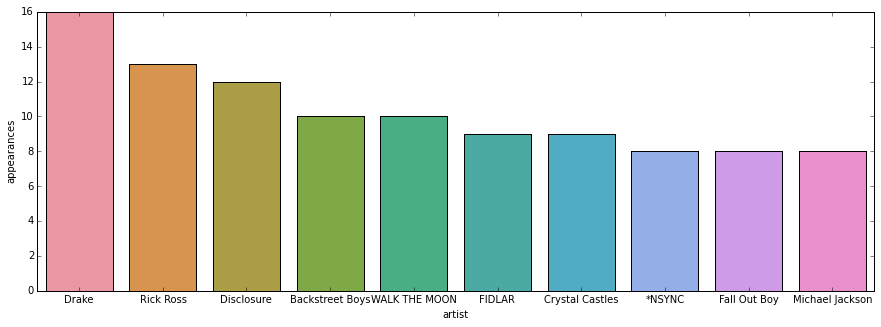

In [85]:

# In[ ]:

speaker_df = data.groupby('artist').count().reset_index()[['artist', 'target']]
speaker_df.columns = ['artist', 'appearances']
speaker_df = speaker_df.sort_values('appearances', ascending=False)
speaker_df.head(10)

plt.figure(figsize=(15,5))
sns.barplot(x='artist', y='appearances', data=speaker_df.head(10))
plt.show()


* 出现频次最高为16，由此可见，该用户在artist特征上不具有集中性，不适合作为特征

所以，删除artist、title两个特征，排除NO、target，17个字段中共计有13个特征可用。

# 0、数据集

In [86]:
#定义训练集和测试集

features = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness","tempo","time_signature","mode","key"]

train, test = train_test_split(data, test_size = 0.20,random_state=0)
print("Training samples: {}; Test samples: {}".format(len(train), len(test)))


X = data[features]
y = data["target"]
X_train = train[features]
y_train = train["target"]

X_test = test[features]
y_test = test["target"]

pos_Y_train=train[train["target"]==1]
print pos_Y_train['target'].value_counts()
neg_Y_train=train[train["target"]==0]
print neg_Y_train['target'].value_counts()

pos_Y_test=test[test["target"]==1]
print pos_Y_test['target'].value_counts()
neg_Y_test=test[test["target"]==0]
print neg_Y_test['target'].value_counts()

Training samples: 1613; Test samples: 404
1    816
Name: target, dtype: int64
0    797
Name: target, dtype: int64
1    204
Name: target, dtype: int64
0    200
Name: target, dtype: int64


* 从数据来看，训练集1613个，测试集404个
* 训练集、测试集各自的正负样本比例与原始数据集比例相同，可以认为数据分布相同


# 一、DT模型
## 1、DT模型初探

In [87]:
#打印树模型结构
def print_tree(estimator, features, class_names=None, filled=True):
    tree = estimator
    names = features
    color = filled
    classn = class_names
    
    dot_data = StringIO()
    export_graphviz(estimator, out_file=dot_data, feature_names=features, class_names=classn, filled=filled)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return(graph)


('feature importances:', array([ 0.08897481,  0.1261903 ,  0.11229747,  0.0989787 ,  0.06750337,
        0.14743535,  0.12535933,  0.08109635,  0.03854408,  0.0838481 ,
        0.00281044,  0.00643904,  0.02052266]))
('train score:', 0.99876007439553627)
('test score:', 0.67574257425742579)


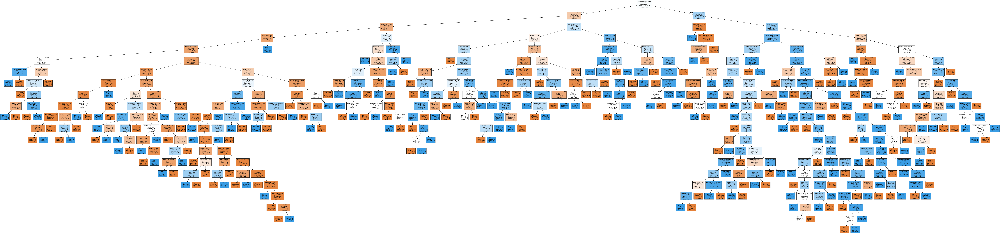

In [88]:
#使用决策树
dt1 = tree.DecisionTreeClassifier(random_state=10)
dt1.fit(X_train, y_train)
print("feature importances:",dt1.feature_importances_)
print("train score:",dt1.score(X_train, y_train))
print("test score:",dt1.score(X_test, y_test))


#可视化
from IPython.display import Image  
graph = print_tree(dt1, features, class_names=['No', 'Yes'])
Image(graph.create_png())

从可视化来看，采用DT的默认参数，树深过大，极易引起过拟合；同时，叶节点存在只有一个样本的情况，也极易引起过拟合。
从训练结果来看，训练集准确率99.87%，测试集准确率67.57%，明显存在过拟合现象，以可视化的结论相呼应。
所以，为了取得较好的模型预测效果，需要对参数进行调优。

另外，"time_signature","mode"两个特征的重要性比较低，去掉这两个特征


接下来调参：

## 2、DT模型调优

In [89]:
#从图上来看，树的深度过大、叶子节点样本数过低是主要原因，采用GridSearch进行寻优
# 
features11 = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness","mode","key"]
X_train11 = train[features11]
X_test11 = test[features11]
tuned_parameters = [{'min_samples_leaf': range(5,50,2),'max_depth': range(5,15,1)},]
gsearch1 = GridSearchCV(estimator = DecisionTreeClassifier(), param_grid=tuned_parameters, cv=3, scoring='roc_auc',n_jobs=-1)
gsearch1.fit(X_train11, y_train)
print(gsearch1.cv_results_['mean_test_score'])
print(gsearch1.cv_results_['params'])
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_
#输出特征重要性


[ 0.77858644  0.777109    0.7782244   0.7773024   0.77892509  0.78065021
  0.78137959  0.77936315  0.77905822  0.78204722  0.78516534  0.7832041
  0.78077072  0.7819455   0.78480548  0.78691507  0.7825471   0.78253632
  0.78210707  0.77660047  0.77581216  0.77451399  0.76725409  0.76518885
  0.75999278  0.76960982  0.7695305   0.77031226  0.77517118  0.77840738
  0.76650764  0.76911457  0.77512418  0.78025075  0.77762757  0.77861736
  0.78013858  0.78499906  0.78692068  0.77917143  0.78231256  0.77957836
  0.77203416  0.77416419  0.77243482  0.76834159  0.74213285  0.74370808
  0.75820418  0.75572368  0.76169656  0.76958077  0.77546226  0.76191424
  0.76527502  0.76668052  0.77570613  0.77188038  0.77330409  0.77711474
  0.78354252  0.78551496  0.77825772  0.78100963  0.77909662  0.77151784
  0.77484877  0.77272755  0.76885329  0.74278912  0.73713376  0.74953435
  0.75884509  0.75920291  0.76298848  0.77597599  0.76044889  0.76348
  0.76754557  0.77351734  0.77438397  0.77460636  0.778

/Library/Python/2.7/site-packages/sklearn/model_selection/_search.py:747: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: 0.77859, std: 0.02133, params: {'max_depth': 5, 'min_samples_leaf': 5},
  mean: 0.77711, std: 0.02240, params: {'max_depth': 5, 'min_samples_leaf': 7},
  mean: 0.77822, std: 0.02047, params: {'max_depth': 5, 'min_samples_leaf': 9},
  mean: 0.77730, std: 0.02039, params: {'max_depth': 5, 'min_samples_leaf': 11},
  mean: 0.77893, std: 0.01942, params: {'max_depth': 5, 'min_samples_leaf': 13},
  mean: 0.78065, std: 0.01841, params: {'max_depth': 5, 'min_samples_leaf': 15},
  mean: 0.78138, std: 0.01880, params: {'max_depth': 5, 'min_samples_leaf': 17},
  mean: 0.77936, std: 0.02906, params: {'max_depth': 5, 'min_samples_leaf': 19},
  mean: 0.77906, std: 0.02977, params: {'max_depth': 5, 'min_samples_leaf': 21},
  mean: 0.78205, std: 0.03230, params: {'max_depth': 5, 'min_samples_leaf': 23},
  mean: 0.78517, std: 0.03247, params: {'max_depth': 5, 'min_samples_leaf': 25},
  mean: 0.78320, std: 0.03337, params: {'max_depth': 5, 'min_samples_leaf': 27},
  mean: 0.78077, std: 0.02833, 

* 最优参数组合为 {'max_depth': 10, 'min_samples_leaf': 17},

('feature importances:', array([ 0.05721153,  0.14995372,  0.12437019,  0.15408614,  0.04350107,
        0.23662558,  0.1677022 ,  0.04207859,  0.02447098,  0.        ,  0.        ]))
('train score:', 0.80843149411035342)
('test score:', 0.67326732673267331)


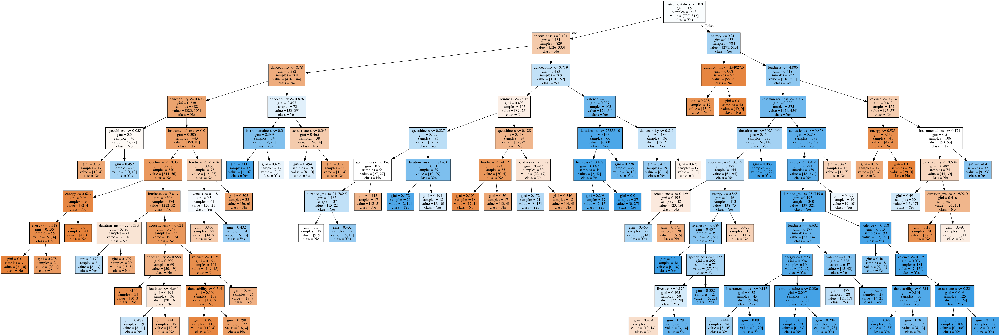

In [90]:
#使用优化参数后的决策树
dt2 = tree.DecisionTreeClassifier(max_depth=10, min_samples_leaf=17,random_state=10)
dt2.fit(X_train11, y_train)
print("feature importances:",dt2.feature_importances_)
print("train score:",dt2.score(X_train11, y_train))
print("test score:",dt2.score(X_test11, y_test))


#可视化
from IPython.display import Image  
graph = print_tree(dt2, features11, class_names=['No', 'Yes'])
Image(graph.create_png())

In [91]:
#去掉最后两个特征，重新调参
features9 = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness"]
X_train9 = train[features9]
X_test9 = test[features9]
tuned_parameters = [{'min_samples_leaf': range(5,50,2),'max_depth': range(5,15,1)},]
gsearch1 = GridSearchCV(estimator = DecisionTreeClassifier(), param_grid=tuned_parameters, cv=3, scoring='roc_auc',n_jobs=-1)
gsearch1.fit(X_train9, y_train)
print(gsearch1.cv_results_['mean_test_score'])
print(gsearch1.cv_results_['params'])
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_
#输出特征重要性



[ 0.77700411  0.77423041  0.77838797  0.77878809  0.78154715  0.78248396
  0.78113935  0.77915109  0.77891081  0.78216731  0.78507775  0.78266704
  0.78077072  0.7819455   0.78480548  0.78691507  0.7825471   0.78253632
  0.78210707  0.77660047  0.77581216  0.77451399  0.76725409  0.76540283
  0.77066154  0.76895557  0.7689343   0.77638957  0.77639746  0.7827489
  0.7705062   0.76739525  0.77621435  0.78053855  0.77848553  0.77861736
  0.78013858  0.78499906  0.78692068  0.77917143  0.78231256  0.77957836
  0.77122972  0.77416419  0.77243482  0.76834159  0.75044012  0.75115865
  0.7557618   0.75722513  0.76357027  0.77434344  0.77900779  0.76370957
  0.76351173  0.76757906  0.77714267  0.77354632  0.7741909   0.77853036
  0.78313224  0.78610485  0.77779903  0.78134385  0.7789468   0.77199498
  0.77474505  0.77258234  0.76881181  0.74187765  0.74271776  0.75510998
  0.76230191  0.76824789  0.76600647  0.77304597  0.76203031  0.76149509
  0.76777431  0.77469772  0.77243203  0.77508928  0.

/Library/Python/2.7/site-packages/sklearn/model_selection/_search.py:747: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: 0.77700, std: 0.02215, params: {'max_depth': 5, 'min_samples_leaf': 5},
  mean: 0.77423, std: 0.01978, params: {'max_depth': 5, 'min_samples_leaf': 7},
  mean: 0.77839, std: 0.01922, params: {'max_depth': 5, 'min_samples_leaf': 9},
  mean: 0.77879, std: 0.01953, params: {'max_depth': 5, 'min_samples_leaf': 11},
  mean: 0.78155, std: 0.01897, params: {'max_depth': 5, 'min_samples_leaf': 13},
  mean: 0.78248, std: 0.01831, params: {'max_depth': 5, 'min_samples_leaf': 15},
  mean: 0.78114, std: 0.01812, params: {'max_depth': 5, 'min_samples_leaf': 17},
  mean: 0.77915, std: 0.02837, params: {'max_depth': 5, 'min_samples_leaf': 19},
  mean: 0.77891, std: 0.02961, params: {'max_depth': 5, 'min_samples_leaf': 21},
  mean: 0.78217, std: 0.03214, params: {'max_depth': 5, 'min_samples_leaf': 23},
  mean: 0.78508, std: 0.03243, params: {'max_depth': 5, 'min_samples_leaf': 25},
  mean: 0.78267, std: 0.03313, params: {'max_depth': 5, 'min_samples_leaf': 27},
  mean: 0.78077, std: 0.02833, 

('feature importances:', array([ 0.0731027 ,  0.16142903,  0.11869183,  0.17566291,  0.00998537,
        0.25328974,  0.18400519,  0.02010985,  0.00372338]))
('train score:', 0.76937383756974587)
('test score:', 0.71534653465346532)


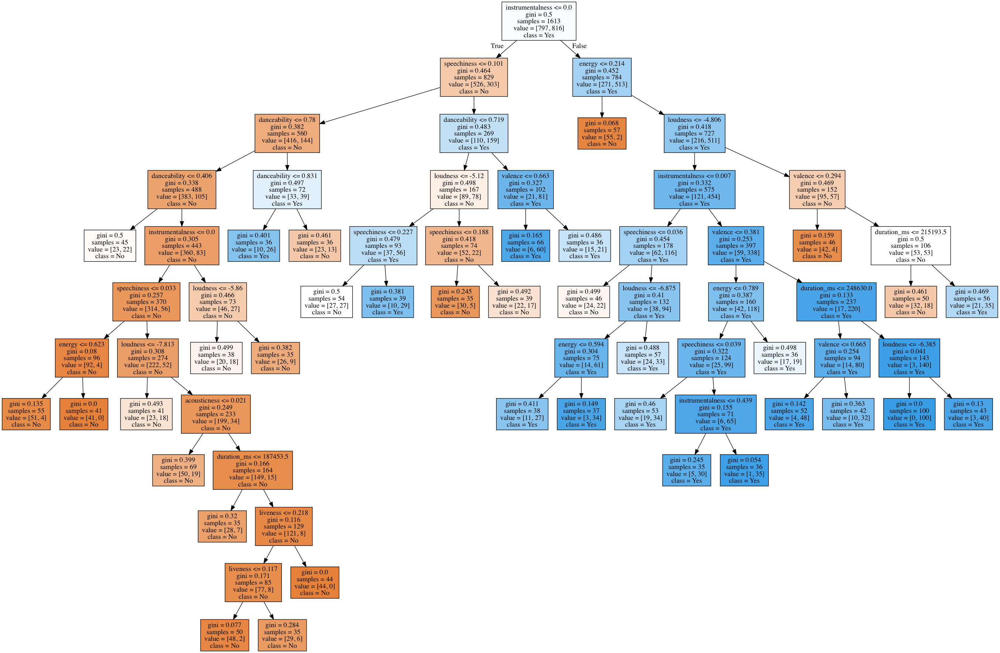

In [92]:
#使用优化参数后的决策树
dt2 = tree.DecisionTreeClassifier(max_depth=11, min_samples_leaf=35,random_state=10)
dt2.fit(X_train9, y_train)
print("feature importances:",dt2.feature_importances_)
print("train score:",dt2.score(X_train9, y_train))
print("test score:",dt2.score(X_test9, y_test))


#可视化
from IPython.display import Image  
graph = print_tree(dt2, features9, class_names=['No', 'Yes'])
Image(graph.create_png())

In [93]:
#去掉第5个特征和第9个特征，重新调参
features7 = ["valence", "energy", "danceability", "speechiness", "instrumentalness", "loudness","duration_ms"]
X_train7 = train[features7]
X_test7 = test[features7]
tuned_parameters = [{'min_samples_leaf': range(5,50,2),'max_depth': range(5,15,1)},]
gsearch1 = GridSearchCV(estimator = DecisionTreeClassifier(), param_grid=tuned_parameters, cv=3, scoring='roc_auc',n_jobs=-1)
gsearch1.fit(X_train7, y_train)
print(gsearch1.cv_results_['mean_test_score'])
print(gsearch1.cv_results_['params'])
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_
#输出特征重要性

[ 0.76636335  0.76092312  0.76662325  0.76891243  0.77220629  0.77547972
  0.77541714  0.77882269  0.77989865  0.78294543  0.78497963  0.7821746
  0.78339099  0.78495334  0.78688637  0.78911354  0.7866151   0.78649355
  0.78555445  0.78647543  0.77974258  0.78523935  0.78198042  0.75887757
  0.75809009  0.76210726  0.76693363  0.77033912  0.77782118  0.77826676
  0.78104206  0.77831874  0.78197035  0.7827391   0.78039551  0.78219163
  0.78022037  0.78939696  0.79003513  0.78233781  0.78435045  0.78415216
  0.78228847  0.78107627  0.78223116  0.78111365  0.74472271  0.75027875
  0.75722667  0.76043825  0.76571288  0.77309262  0.7756434   0.77515988
  0.77197988  0.77680197  0.78192327  0.77899285  0.77940833  0.77963062
  0.79011274  0.78969533  0.78080754  0.78373756  0.78297201  0.7824452
  0.78149117  0.78245474  0.78165071  0.73550941  0.74191248  0.7593429
  0.76478417  0.76707465  0.77275333  0.77272364  0.77583276  0.77240046
  0.77749785  0.78435016  0.77984145  0.7797149   0.78

/Library/Python/2.7/site-packages/sklearn/model_selection/_search.py:747: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: 0.76636, std: 0.02141, params: {'max_depth': 5, 'min_samples_leaf': 5},
  mean: 0.76092, std: 0.02894, params: {'max_depth': 5, 'min_samples_leaf': 7},
  mean: 0.76662, std: 0.02451, params: {'max_depth': 5, 'min_samples_leaf': 9},
  mean: 0.76891, std: 0.02071, params: {'max_depth': 5, 'min_samples_leaf': 11},
  mean: 0.77221, std: 0.02172, params: {'max_depth': 5, 'min_samples_leaf': 13},
  mean: 0.77548, std: 0.02295, params: {'max_depth': 5, 'min_samples_leaf': 15},
  mean: 0.77542, std: 0.02298, params: {'max_depth': 5, 'min_samples_leaf': 17},
  mean: 0.77882, std: 0.02423, params: {'max_depth': 5, 'min_samples_leaf': 19},
  mean: 0.77990, std: 0.02295, params: {'max_depth': 5, 'min_samples_leaf': 21},
  mean: 0.78295, std: 0.02567, params: {'max_depth': 5, 'min_samples_leaf': 23},
  mean: 0.78498, std: 0.02561, params: {'max_depth': 5, 'min_samples_leaf': 25},
  mean: 0.78217, std: 0.02615, params: {'max_depth': 5, 'min_samples_leaf': 27},
  mean: 0.78339, std: 0.02295, 

('feature importances:', array([ 0.07559911,  0.16208552,  0.12447297,  0.17637729,  0.2579152 ,
        0.18475349,  0.01879642]))
('train score:', 0.76937383756974587)
('test score:', 0.71534653465346532)


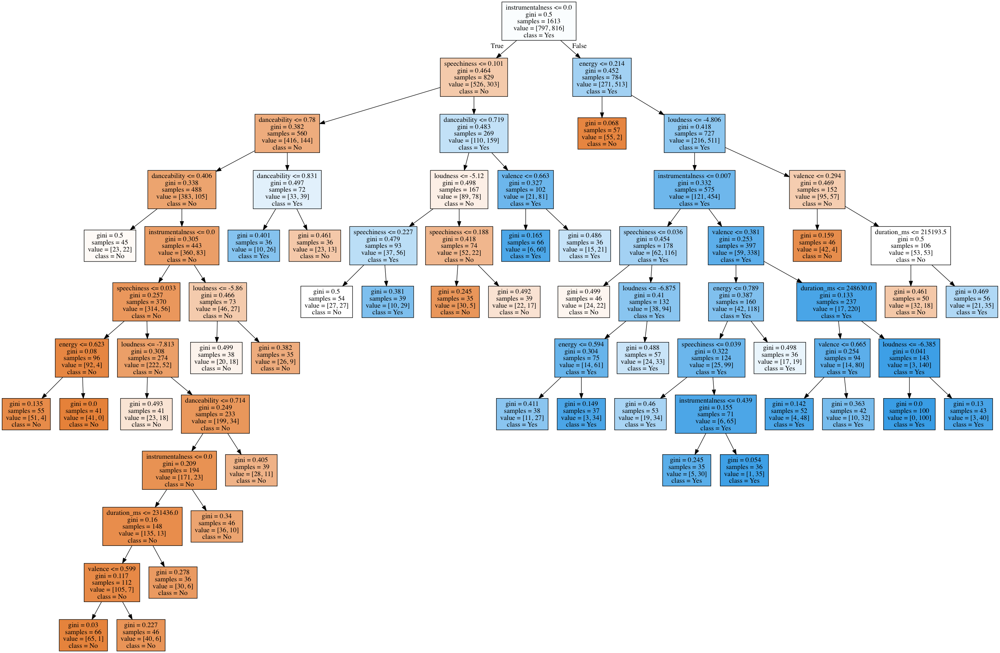

In [94]:
#使用优化参数后的决策树
dt2 = tree.DecisionTreeClassifier(max_depth=14, min_samples_leaf=35,random_state=10)
dt2.fit(X_train7, y_train)
print("feature importances:",dt2.feature_importances_)
print("train score:",dt2.score(X_train7, y_train))
print("test score:",dt2.score(X_test7, y_test))


#可视化
from IPython.display import Image  
graph = print_tree(dt2, features7, class_names=['No', 'Yes'])
Image(graph.create_png())

In [95]:
#增加对最大叶子节点数的调参
features7 = ["valence", "energy", "danceability", "speechiness", "instrumentalness", "loudness","duration_ms"]
X_train7 = train[features7]
X_test7 = test[features7]
tuned_parameters = [{'min_samples_leaf': range(5,50,2),'max_depth': range(5,15,1),'max_leaf_nodes': range(20,100,10)},]
gsearch1 = GridSearchCV(estimator = DecisionTreeClassifier(), param_grid=tuned_parameters, cv=3, scoring='roc_auc',n_jobs=-1)
gsearch1.fit(X_train7, y_train)
print(gsearch1.cv_results_['mean_test_score'])
print(gsearch1.cv_results_['params'])
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_
#输出特征重要性

[ 0.7638351   0.7620973   0.76711994 ...,  0.78102326  0.78291804
  0.78165071]
[{'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 5}, {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 7}, {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 9}, {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 11}, {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 13}, {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 15}, {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 17}, {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 19}, {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 21}, {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 23}, {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 25}, {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 27}, {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 29}, {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 31}, {'max_leaf_nodes': 20, 'ma

/Library/Python/2.7/site-packages/sklearn/model_selection/_search.py:747: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: 0.76384, std: 0.02493, params: {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 5},
  mean: 0.76210, std: 0.02874, params: {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 7},
  mean: 0.76712, std: 0.02207, params: {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 9},
  mean: 0.77376, std: 0.02164, params: {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 11},
  mean: 0.77243, std: 0.02099, params: {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 13},
  mean: 0.77503, std: 0.01871, params: {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 15},
  mean: 0.77666, std: 0.02012, params: {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 17},
  mean: 0.77876, std: 0.02116, params: {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 19},
  mean: 0.77405, std: 0.02790, params: {'max_leaf_nodes': 20, 'max_depth': 5, 'min_samples_leaf': 21},
  mean: 0.78240, std: 0.03046, params: {'max_leaf_nodes': 20, 'max_depth': 5

('feature importances:', array([ 0.07396203,  0.16332663,  0.12542608,  0.17772784,  0.25626717,
        0.18616818,  0.01712207]))
('train score:', 0.76937383756974587)
('test score:', 0.71534653465346532)


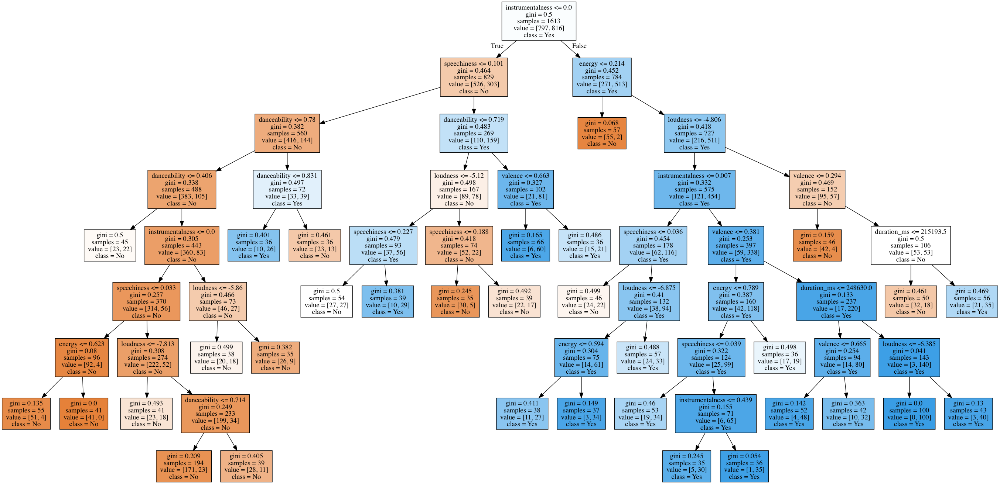

In [96]:
#使用优化参数后的决策树
dt2 = tree.DecisionTreeClassifier(max_depth=7, min_samples_leaf=35, max_leaf_nodes= 40,random_state=10)
dt2.fit(X_train7, y_train)
print("feature importances:",dt2.feature_importances_)
print("train score:",dt2.score(X_train7, y_train))
print("test score:",dt2.score(X_test7, y_test))


#可视化
from IPython.display import Image  
graph = print_tree(dt2, features7, class_names=['No', 'Yes'])
Image(graph.create_png())

## 3、结论
通过调优，训练集和测试集分别稳定在76.94%和71.53%，gap不大，可以认为已经达到最好参数优化效果。

# RF模型
## RF初探

In [97]:
#使用RF

from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(random_state=10)
rf.fit(X_train, y_train)

print ("RF Accuracy of train :",rf.score(X_train, y_train))
print ("RF Accuracy of test:",rf.score(X_test, y_test))
print ("feature importances:",rf.feature_importances_)




('RF Accuracy of train :', 0.98698078115313082)
('RF Accuracy of test:', 0.7277227722772277)
('feature importances:', array([ 0.07232375,  0.09161906,  0.09049704,  0.09268867,  0.08956403,
        0.13906261,  0.12225333,  0.11018862,  0.05782645,  0.07636303,
        0.00815889,  0.00937364,  0.0400809 ]))


## 参数调优

In [135]:
#
features11 = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness","tempo","key"]
X_train = train[features11]
X_test = test[features11]
tuned_parameters = [{'n_estimators':range(10,101,10),}]
gsearch1 = GridSearchCV(estimator = RandomForestClassifier(random_state=10), param_grid=tuned_parameters, cv=10, scoring='accuracy',n_jobs=-1)
gsearch1.fit(X_train, y_train)
print(gsearch1.cv_results_['mean_test_score'])
print(gsearch1.cv_results_['params'])
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_
#输出特征重要性

[ 0.76069436  0.76193428  0.77557347  0.77371358  0.77681339  0.77619343
  0.77371358  0.77061376  0.77247365  0.77371358]
[{'n_estimators': 10}, {'n_estimators': 20}, {'n_estimators': 30}, {'n_estimators': 40}, {'n_estimators': 50}, {'n_estimators': 60}, {'n_estimators': 70}, {'n_estimators': 80}, {'n_estimators': 90}, {'n_estimators': 100}]


/Library/Python/2.7/site-packages/sklearn/model_selection/_search.py:747: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: 0.76069, std: 0.02449, params: {'n_estimators': 10},
  mean: 0.76193, std: 0.03401, params: {'n_estimators': 20},
  mean: 0.77557, std: 0.03787, params: {'n_estimators': 30},
  mean: 0.77371, std: 0.03817, params: {'n_estimators': 40},
  mean: 0.77681, std: 0.03887, params: {'n_estimators': 50},
  mean: 0.77619, std: 0.04307, params: {'n_estimators': 60},
  mean: 0.77371, std: 0.04134, params: {'n_estimators': 70},
  mean: 0.77061, std: 0.04162, params: {'n_estimators': 80},
  mean: 0.77247, std: 0.04102, params: {'n_estimators': 90},
  mean: 0.77371, std: 0.03809, params: {'n_estimators': 100}],
 {'n_estimators': 50},
 0.77681339119652826)

In [136]:

features11 = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness","tempo","key"]
X_train = train[features11]
X_test = test[features11]
tuned_parameters = [{'max_features':range(1,10,1),}]
gsearch1 = GridSearchCV(estimator = RandomForestClassifier(n_estimators=50,random_state=10), param_grid=tuned_parameters, cv=10, scoring='accuracy',n_jobs=-1)
gsearch1.fit(X_train, y_train)
print(gsearch1.cv_results_['mean_test_score'])
print(gsearch1.cv_results_['params'])
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_
#输出特征重要性

[ 0.76875387  0.76875387  0.77681339  0.76317421  0.7650341   0.76689399
  0.76565406  0.76441414  0.76441414]
[{'max_features': 1}, {'max_features': 2}, {'max_features': 3}, {'max_features': 4}, {'max_features': 5}, {'max_features': 6}, {'max_features': 7}, {'max_features': 8}, {'max_features': 9}]


/Library/Python/2.7/site-packages/sklearn/model_selection/_search.py:747: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: 0.76875, std: 0.04365, params: {'max_features': 1},
  mean: 0.76875, std: 0.04105, params: {'max_features': 2},
  mean: 0.77681, std: 0.03887, params: {'max_features': 3},
  mean: 0.76317, std: 0.03232, params: {'max_features': 4},
  mean: 0.76503, std: 0.04392, params: {'max_features': 5},
  mean: 0.76689, std: 0.03165, params: {'max_features': 6},
  mean: 0.76565, std: 0.03665, params: {'max_features': 7},
  mean: 0.76441, std: 0.03452, params: {'max_features': 8},
  mean: 0.76441, std: 0.03635, params: {'max_features': 9}],
 {'max_features': 3},
 0.77681339119652826)

In [137]:

features11 = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness","tempo","key"]
X_train = train[features11]
X_test = test[features11]
# tuned_parameters = [{'max_depth':range(1,10,1),'min_samples_split':range(10,100,10),'min_samples_leaf':range(1,10,1),}]
tuned_parameters = [{'max_depth':range(1,20,1),}]

gsearch1 = GridSearchCV(estimator = RandomForestClassifier(n_estimators=50,max_features=3,random_state=10), param_grid=tuned_parameters, cv=10, scoring='accuracy',n_jobs=-1)
gsearch1.fit(X_train, y_train)
print(gsearch1.cv_results_['mean_test_score'])
print(gsearch1.cv_results_['params'])
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_
#输出特征重要性

[ 0.71543707  0.71419715  0.74457533  0.75573466  0.76069436  0.76441414
  0.7699938   0.77061376  0.77123373  0.7749535   0.76875387  0.76875387
  0.76751395  0.7749535   0.77123373  0.77185369  0.77743335  0.76875387
  0.77681339]
[{'max_depth': 1}, {'max_depth': 2}, {'max_depth': 3}, {'max_depth': 4}, {'max_depth': 5}, {'max_depth': 6}, {'max_depth': 7}, {'max_depth': 8}, {'max_depth': 9}, {'max_depth': 10}, {'max_depth': 11}, {'max_depth': 12}, {'max_depth': 13}, {'max_depth': 14}, {'max_depth': 15}, {'max_depth': 16}, {'max_depth': 17}, {'max_depth': 18}, {'max_depth': 19}]


/Library/Python/2.7/site-packages/sklearn/model_selection/_search.py:747: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: 0.71544, std: 0.04306, params: {'max_depth': 1},
  mean: 0.71420, std: 0.05945, params: {'max_depth': 2},
  mean: 0.74458, std: 0.05126, params: {'max_depth': 3},
  mean: 0.75573, std: 0.03660, params: {'max_depth': 4},
  mean: 0.76069, std: 0.04915, params: {'max_depth': 5},
  mean: 0.76441, std: 0.03840, params: {'max_depth': 6},
  mean: 0.76999, std: 0.04775, params: {'max_depth': 7},
  mean: 0.77061, std: 0.04220, params: {'max_depth': 8},
  mean: 0.77123, std: 0.04199, params: {'max_depth': 9},
  mean: 0.77495, std: 0.03965, params: {'max_depth': 10},
  mean: 0.76875, std: 0.04492, params: {'max_depth': 11},
  mean: 0.76875, std: 0.04463, params: {'max_depth': 12},
  mean: 0.76751, std: 0.04648, params: {'max_depth': 13},
  mean: 0.77495, std: 0.05180, params: {'max_depth': 14},
  mean: 0.77123, std: 0.04241, params: {'max_depth': 15},
  mean: 0.77185, std: 0.05089, params: {'max_depth': 16},
  mean: 0.77743, std: 0.04020, params: {'max_depth': 17},
  mean: 0.76875, std: 0

In [138]:
features11 = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness","tempo","key"]
X_train = train[features11]
X_test = test[features11]
# tuned_parameters = [{'max_depth':range(1,10,1),'min_samples_split':range(10,100,10),'min_samples_leaf':range(1,10,1),}]
tuned_parameters = [{'min_samples_split':range(10,100,10),'min_samples_leaf':range(1,10,1),}]

gsearch1 = GridSearchCV(estimator = RandomForestClassifier(n_estimators=50,max_features=3,random_state=10,max_depth=17), param_grid=tuned_parameters, cv=10, scoring='accuracy',n_jobs=-1)
gsearch1.fit(X_train, y_train)
print(gsearch1.cv_results_['mean_test_score'])
print(gsearch1.cv_results_['params'])
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_
#输出特征重要性

[ 0.77123373  0.77619343  0.76627402  0.77061376  0.76379417  0.75635462
  0.75759454  0.76441414  0.76379417  0.77247365  0.77123373  0.76379417
  0.76751395  0.77185369  0.75697458  0.76255425  0.76317421  0.76069436
  0.77743335  0.76751395  0.76689399  0.76813391  0.76627402  0.7650341
  0.76193428  0.76627402  0.76069436  0.77929324  0.77185369  0.76627402
  0.76751395  0.77185369  0.77123373  0.76627402  0.76751395  0.76937384
  0.78363298  0.7699938   0.76193428  0.76069436  0.76689399  0.7650341
  0.7650341   0.76937384  0.76131432  0.77619343  0.77061376  0.77371358
  0.76627402  0.76689399  0.75945443  0.7600744   0.7650341   0.75883447
  0.77433354  0.7699938   0.76751395  0.7650341   0.76565406  0.7600744
  0.76069436  0.76317421  0.75821451  0.77867328  0.7699938   0.75883447
  0.76131432  0.76441414  0.75945443  0.75821451  0.76379417  0.76069436
  0.76875387  0.77185369  0.76069436  0.7600744   0.76131432  0.76069436
  0.76255425  0.76131432  0.75697458]
[{'min_samples_s

/Library/Python/2.7/site-packages/sklearn/model_selection/_search.py:747: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: 0.77123, std: 0.04250, params: {'min_samples_split': 10, 'min_samples_leaf': 1},
  mean: 0.77619, std: 0.04190, params: {'min_samples_split': 20, 'min_samples_leaf': 1},
  mean: 0.76627, std: 0.04588, params: {'min_samples_split': 30, 'min_samples_leaf': 1},
  mean: 0.77061, std: 0.03961, params: {'min_samples_split': 40, 'min_samples_leaf': 1},
  mean: 0.76379, std: 0.04479, params: {'min_samples_split': 50, 'min_samples_leaf': 1},
  mean: 0.75635, std: 0.04412, params: {'min_samples_split': 60, 'min_samples_leaf': 1},
  mean: 0.75759, std: 0.04716, params: {'min_samples_split': 70, 'min_samples_leaf': 1},
  mean: 0.76441, std: 0.04999, params: {'min_samples_split': 80, 'min_samples_leaf': 1},
  mean: 0.76379, std: 0.04757, params: {'min_samples_split': 90, 'min_samples_leaf': 1},
  mean: 0.77247, std: 0.04146, params: {'min_samples_split': 10, 'min_samples_leaf': 2},
  mean: 0.77123, std: 0.04640, params: {'min_samples_split': 20, 'min_samples_leaf': 2},
  mean: 0.76379, std:

In [140]:
features11 = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness","tempo","key"]
X_train = train[features11]
X_test = test[features11]


rf2=RandomForestClassifier(oob_score=True,random_state=10,n_estimators=50,max_features=3,max_depth=17,min_samples_leaf= 5, min_samples_split=10)
rf2.fit(X_train, y_train)

print "袋外测试：",rf2.oob_score_
print ("RF Accuracy of train :",rf2.score(X_train, y_train))
print ("RF Accuracy of test:",rf2.score(X_test, y_test))
print ("feature importances:",rf2.feature_importances_)

 袋外测试： 0.761314321141
('RF Accuracy of train :', 0.92684438933663982)
('RF Accuracy of test:', 0.75247524752475248)
('feature importances:', array([ 0.06168876,  0.10443833,  0.10546943,  0.11467276,  0.08574069,
        0.16820908,  0.13648942,  0.08841325,  0.04310096,  0.06422963,
        0.02754769]))


## 第二轮调优
测试集准确率与袋外测试准确率接近，但是与训练集还有差距，做第二轮调优

In [143]:
features11 = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness","tempo","key"]
X_train = train[features11]
X_test = test[features11]
# tuned_parameters = [{'max_depth':range(1,10,1),'min_samples_split':range(10,100,10),'min_samples_leaf':range(1,10,1),}]
tuned_parameters = [{'n_estimators':range(10,201,10),}]
#n_estimators=50,max_features=3,max_depth=17,min_samples_leaf= 5, min_samples_split=10
gsearch1 = GridSearchCV(estimator = RandomForestClassifier(random_state=10,max_features=3,max_depth=17,min_samples_leaf= 5, min_samples_split=10), param_grid=tuned_parameters, cv=10, scoring='accuracy',n_jobs=-1)
gsearch1.fit(X_train, y_train)
print(gsearch1.cv_results_['mean_test_score'])
print(gsearch1.cv_results_['params'])
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_
#输出特征重要性

[ 0.75821451  0.77123373  0.77061376  0.77805332  0.78363298  0.77805332
  0.77929324  0.77681339  0.77743335  0.77681339  0.7749535   0.77433354
  0.7749535   0.77557347  0.77743335  0.77557347  0.77867328  0.77743335
  0.77681339  0.77805332]
[{'n_estimators': 10}, {'n_estimators': 20}, {'n_estimators': 30}, {'n_estimators': 40}, {'n_estimators': 50}, {'n_estimators': 60}, {'n_estimators': 70}, {'n_estimators': 80}, {'n_estimators': 90}, {'n_estimators': 100}, {'n_estimators': 110}, {'n_estimators': 120}, {'n_estimators': 130}, {'n_estimators': 140}, {'n_estimators': 150}, {'n_estimators': 160}, {'n_estimators': 170}, {'n_estimators': 180}, {'n_estimators': 190}, {'n_estimators': 200}]


/Library/Python/2.7/site-packages/sklearn/model_selection/_search.py:747: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: 0.75821, std: 0.03680, params: {'n_estimators': 10},
  mean: 0.77123, std: 0.03960, params: {'n_estimators': 20},
  mean: 0.77061, std: 0.03095, params: {'n_estimators': 30},
  mean: 0.77805, std: 0.03538, params: {'n_estimators': 40},
  mean: 0.78363, std: 0.03619, params: {'n_estimators': 50},
  mean: 0.77805, std: 0.04174, params: {'n_estimators': 60},
  mean: 0.77929, std: 0.04469, params: {'n_estimators': 70},
  mean: 0.77681, std: 0.04472, params: {'n_estimators': 80},
  mean: 0.77743, std: 0.03808, params: {'n_estimators': 90},
  mean: 0.77681, std: 0.03923, params: {'n_estimators': 100},
  mean: 0.77495, std: 0.04166, params: {'n_estimators': 110},
  mean: 0.77433, std: 0.04150, params: {'n_estimators': 120},
  mean: 0.77495, std: 0.04348, params: {'n_estimators': 130},
  mean: 0.77557, std: 0.04579, params: {'n_estimators': 140},
  mean: 0.77743, std: 0.04473, params: {'n_estimators': 150},
  mean: 0.77557, std: 0.04596, params: {'n_estimators': 160},
  mean: 0.77867, 

In [144]:
features11 = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness","tempo","key"]
X_train = train[features11]
X_test = test[features11]
# tuned_parameters = [{'max_depth':range(1,10,1),'min_samples_split':range(10,100,10),'min_samples_leaf':range(1,10,1),}]
tuned_parameters = [{'max_features':range(1,11,1),}]
#n_estimators=50,max_features=3,max_depth=17,min_samples_leaf= 5, min_samples_split=10
gsearch1 = GridSearchCV(estimator = RandomForestClassifier(random_state=10,n_estimators=50,max_depth=17,min_samples_leaf= 5, min_samples_split=10), param_grid=tuned_parameters, cv=10, scoring='accuracy',n_jobs=-1)

gsearch1.fit(X_train, y_train)
print(gsearch1.cv_results_['mean_test_score'])
print(gsearch1.cv_results_['params'])
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_
#输出特征重要性

[ 0.75573466  0.77619343  0.78363298  0.77309361  0.77061376  0.76689399
  0.76689399  0.76317421  0.76379417  0.76317421]
[{'max_features': 1}, {'max_features': 2}, {'max_features': 3}, {'max_features': 4}, {'max_features': 5}, {'max_features': 6}, {'max_features': 7}, {'max_features': 8}, {'max_features': 9}, {'max_features': 10}]


/Library/Python/2.7/site-packages/sklearn/model_selection/_search.py:747: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: 0.75573, std: 0.04425, params: {'max_features': 1},
  mean: 0.77619, std: 0.04080, params: {'max_features': 2},
  mean: 0.78363, std: 0.03619, params: {'max_features': 3},
  mean: 0.77309, std: 0.04445, params: {'max_features': 4},
  mean: 0.77061, std: 0.04276, params: {'max_features': 5},
  mean: 0.76689, std: 0.04153, params: {'max_features': 6},
  mean: 0.76689, std: 0.04505, params: {'max_features': 7},
  mean: 0.76317, std: 0.04030, params: {'max_features': 8},
  mean: 0.76379, std: 0.03960, params: {'max_features': 9},
  mean: 0.76317, std: 0.04450, params: {'max_features': 10}],
 {'max_features': 3},
 0.78363298202107878)

In [145]:
features11 = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness","tempo","key"]
X_train = train[features11]
X_test = test[features11]
# tuned_parameters = [{'max_depth':range(1,10,1),'min_samples_split':range(10,100,10),'min_samples_leaf':range(1,10,1),}]
tuned_parameters = [{'max_depth':range(5,20,1),}]
#n_estimators=50,max_features=3,max_depth=17,min_samples_leaf= 5, min_samples_split=10
gsearch1 = GridSearchCV(estimator = RandomForestClassifier(random_state=10,n_estimators=50,max_features=3,min_samples_leaf= 5, min_samples_split=10), param_grid=tuned_parameters, cv=10, scoring='accuracy',n_jobs=-1)

gsearch1.fit(X_train, y_train)
print(gsearch1.cv_results_['mean_test_score'])
print(gsearch1.cv_results_['params'])
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_
#输出特征重要性

[ 0.76379417  0.76317421  0.76317421  0.77805332  0.77309361  0.77309361
  0.77247365  0.77433354  0.7749535   0.77619343  0.77991321  0.77929324
  0.78363298  0.78239306  0.78239306]
[{'max_depth': 5}, {'max_depth': 6}, {'max_depth': 7}, {'max_depth': 8}, {'max_depth': 9}, {'max_depth': 10}, {'max_depth': 11}, {'max_depth': 12}, {'max_depth': 13}, {'max_depth': 14}, {'max_depth': 15}, {'max_depth': 16}, {'max_depth': 17}, {'max_depth': 18}, {'max_depth': 19}]


/Library/Python/2.7/site-packages/sklearn/model_selection/_search.py:747: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: 0.76379, std: 0.04009, params: {'max_depth': 5},
  mean: 0.76317, std: 0.04426, params: {'max_depth': 6},
  mean: 0.76317, std: 0.04856, params: {'max_depth': 7},
  mean: 0.77805, std: 0.04602, params: {'max_depth': 8},
  mean: 0.77309, std: 0.04921, params: {'max_depth': 9},
  mean: 0.77309, std: 0.04188, params: {'max_depth': 10},
  mean: 0.77247, std: 0.04629, params: {'max_depth': 11},
  mean: 0.77433, std: 0.03921, params: {'max_depth': 12},
  mean: 0.77495, std: 0.04426, params: {'max_depth': 13},
  mean: 0.77619, std: 0.03789, params: {'max_depth': 14},
  mean: 0.77991, std: 0.04072, params: {'max_depth': 15},
  mean: 0.77929, std: 0.03428, params: {'max_depth': 16},
  mean: 0.78363, std: 0.03619, params: {'max_depth': 17},
  mean: 0.78239, std: 0.03611, params: {'max_depth': 18},
  mean: 0.78239, std: 0.03611, params: {'max_depth': 19}],
 {'max_depth': 17},
 0.78363298202107878)

In [146]:
features11 = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness","tempo","key"]
X_train = train[features11]
X_test = test[features11]
# tuned_parameters = [{'max_depth':range(1,10,1),'min_samples_split':range(10,100,10),'min_samples_leaf':range(1,10,1),}]
tuned_parameters = [{'min_samples_leaf':range(1,20,1),'min_samples_split':range(10,100,1)}]
#n_estimators=50,max_features=3,max_depth=17,min_samples_leaf= 5, min_samples_split=10
gsearch1 = GridSearchCV(estimator = RandomForestClassifier(random_state=10,n_estimators=50,max_features=3,max_depth=17), param_grid=tuned_parameters, cv=10, scoring='accuracy',n_jobs=-1)

gsearch1.fit(X_train, y_train)
print(gsearch1.cv_results_['mean_test_score'])
print(gsearch1.cv_results_['params'])
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_
#输出特征重要性

[ 0.77123373  0.77743335  0.77433354 ...,  0.75387477  0.75449473
  0.75387477]
[{'min_samples_split': 10, 'min_samples_leaf': 1}, {'min_samples_split': 11, 'min_samples_leaf': 1}, {'min_samples_split': 12, 'min_samples_leaf': 1}, {'min_samples_split': 13, 'min_samples_leaf': 1}, {'min_samples_split': 14, 'min_samples_leaf': 1}, {'min_samples_split': 15, 'min_samples_leaf': 1}, {'min_samples_split': 16, 'min_samples_leaf': 1}, {'min_samples_split': 17, 'min_samples_leaf': 1}, {'min_samples_split': 18, 'min_samples_leaf': 1}, {'min_samples_split': 19, 'min_samples_leaf': 1}, {'min_samples_split': 20, 'min_samples_leaf': 1}, {'min_samples_split': 21, 'min_samples_leaf': 1}, {'min_samples_split': 22, 'min_samples_leaf': 1}, {'min_samples_split': 23, 'min_samples_leaf': 1}, {'min_samples_split': 24, 'min_samples_leaf': 1}, {'min_samples_split': 25, 'min_samples_leaf': 1}, {'min_samples_split': 26, 'min_samples_leaf': 1}, {'min_samples_split': 27, 'min_samples_leaf': 1}, {'min_samples_split

/Library/Python/2.7/site-packages/sklearn/model_selection/_search.py:747: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: 0.77123, std: 0.04250, params: {'min_samples_split': 10, 'min_samples_leaf': 1},
  mean: 0.77743, std: 0.04357, params: {'min_samples_split': 11, 'min_samples_leaf': 1},
  mean: 0.77433, std: 0.03834, params: {'min_samples_split': 12, 'min_samples_leaf': 1},
  mean: 0.77371, std: 0.04233, params: {'min_samples_split': 13, 'min_samples_leaf': 1},
  mean: 0.77495, std: 0.04086, params: {'min_samples_split': 14, 'min_samples_leaf': 1},
  mean: 0.77929, std: 0.03314, params: {'min_samples_split': 15, 'min_samples_leaf': 1},
  mean: 0.77495, std: 0.04344, params: {'min_samples_split': 16, 'min_samples_leaf': 1},
  mean: 0.77867, std: 0.04039, params: {'min_samples_split': 17, 'min_samples_leaf': 1},
  mean: 0.77867, std: 0.03993, params: {'min_samples_split': 18, 'min_samples_leaf': 1},
  mean: 0.77185, std: 0.04919, params: {'min_samples_split': 19, 'min_samples_leaf': 1},
  mean: 0.77619, std: 0.04190, params: {'min_samples_split': 20, 'min_samples_leaf': 1},
  mean: 0.77371, std:

In [148]:
features11 = ["valence", "energy", "danceability", "speechiness", "acousticness", "instrumentalness", "loudness","duration_ms","liveness","tempo","key"]
X_train = train[features11]
X_test = test[features11]


rf2=RandomForestClassifier(oob_score=True,random_state=10,n_estimators=50,max_features=3,max_depth=17,min_samples_leaf= 5, min_samples_split=10)
rf2.fit(X_train, y_train)

print "袋外测试：",rf2.oob_score_
print ("RF Accuracy of train :",rf2.score(X_train, y_train))
print ("RF Accuracy of test:",rf2.score(X_test, y_test))
print ("feature importances:",rf2.feature_importances_)

袋外测试： 0.761314321141
('RF Accuracy of train :', 0.92684438933663982)
('RF Accuracy of test:', 0.75247524752475248)
('feature importances:', array([ 0.06168876,  0.10443833,  0.10546943,  0.11467276,  0.08574069,
        0.16820908,  0.13648942,  0.08841325,  0.04310096,  0.06422963,
        0.02754769]))


In [ ]:
## 结论

* 参数不再发生变化，可以认为获取到局部最优参数及局部最优解。
* 袋外测试、测试集与训练集的准确率差距较大，仍然存在过拟合现象，有优化空间。

In [ ]:
#使用RF

from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(random_state=10)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
score = accuracy_score(y_test, y_pred) * 100
rounded_score = round(score, 1)
print("RF Accuracy: {}%".format(rounded_score))


#使用GBDT
from sklearn.ensemble import GradientBoostingClassifier
gbc=GradientBoostingClassifier(random_state=10)
gbc.fit(X_train, y_train)
y_pred = gbc.predict(X_test)
score = accuracy_score(y_test, y_pred) * 100
rounded_score = round(score, 1)
print("GBDT Accuracy: {}%".format(rounded_score))


# #使用xgboost
# from xgboost.sklearn import XGBClassifier
# xgb=XGBClassifier(random_state=10)
# xgb.fit(X_train, y_train)
# y_pred = xgb.predict(X_test)
# score = accuracy_score(y_test, y_pred) * 100
# rounded_score = round(score, 1)
# print("Xgboost Accuracy: {}%".format(rounded_score))

In [ ]:
#2.使用全体数据训练？会引发过拟合
dt2 = c.fit(X, y)
y_pred2 = c.predict(X)
score = accuracy_score(y, y_pred2) * 100
rounded_score = round(score, 1)
print("Decision Tree Classifier Accuracy: {}%".format(rounded_score))


#K折交叉验证
c2 = tree.DecisionTreeClassifier(min_samples_leaf=3, random_state=10)
kf_10 = KFold(n_splits=10)
predicted = cross_val_predict(c2, X, y, cv=kf_10, method='predict')
print ("Error Rate: ", 1-accuracy_score(y, predicted), "\n")
print (classification_report(y, predicted))


#打印决策树的树结构
graph = print_tree(c, features, class_names=['No', 'Yes'])
Image(graph.create_png())


#使用GridSearch调参

tuned_parameters = [{'min_samples_leaf': [1, 2, 3, 5, 10]},{'max_leaf_nodes': [2, 3, 5, 10]},]
clf = GridSearchCV(DecisionTreeClassifier(), tuned_parameters, cv=10, scoring='accuracy')
clf.fit(X_train, y_train)
#clf.grid_scores_
#clf.cv_results_
print(clf.cv_results_['mean_test_score'])
print(clf.cv_results_['params'])

#输出特征重要性
print (c.feature_importances_)





In [24]:
# In[16]:

#keep dancability, loudness, Speechiness, Valence,Energy, Instrumentalness.


# In[25]:

features_rec = ["valence", "energy", "danceability", "speechiness", "instrumentalness", "loudness"]
X_train2 = train[features_rec]
y_train2 = train["target"]
X_test2 = test[features_rec]
y_test2 = test["target"]
X2 = data[features_rec]
y2 = data["target"]


# In[30]:

#随机森林模型 n_estimators = 10
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators = 100)
clf.fit(X_train2, y_train2)
forest_y_pred = clf.predict(X2)
score = accuracy_score(y2, forest_y_pred) * 100
rounded_score = round(score, 1)
print("Random Forest (n_est: 100) Accuracy: {}%".format(rounded_score))


#随机森林模型 n_estimators = 100，10折交叉
clf2 = RandomForestClassifier(n_estimators = 100)
kf_10 = KFold(n_splits=10)
predicted = cross_val_predict(clf2, X2, y2, cv=kf_10, method='predict')
print ("Error Rate: ", 1-accuracy_score(y2, predicted), "\n")
print (classification_report(y2, predicted))


from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split


#AdaBoostClassifier，n_estimators = 100，是否用10折交叉
abc = AdaBoostClassifier()
abc.fit(X_train2, y_train2)
tst_pred = abc.predict(X_test2)
print (np.count_nonzero(tst_pred == y_test2) / float(y_test2.size))
abc2 = AdaBoostClassifier()
kf_10 = KFold(n_splits=10)
predicted = cross_val_predict(clf2, X, y, cv=kf_10, method='predict')
print ("Error Rate: ", 1-accuracy_score(y, predicted), "\n")
print (classification_report(y, predicted))






Random Forest (n_est: 100) Accuracy: 94.6%
('Error Rate: ', 0.37233515121467531, '\n')
             precision    recall  f1-score   support

          0       0.64      0.57      0.60       997
          1       0.62      0.69      0.65      1020

avg / total       0.63      0.63      0.63      2017

0.693069306931
('Error Rate: ', 0.35250371839365391, '\n')
             precision    recall  f1-score   support

          0       0.66      0.59      0.62       997
          1       0.64      0.70      0.67      1020

avg / total       0.65      0.65      0.65      2017



In [25]:
# In[ ]:

#叶子节点采用不同的阈值，每个阈值都执行多次求均值，查看最优阈值
hidden_neuron_nums = list(range(1,10))
#[2,3,4,5,6...9, 10, 20, 30, ... 90, 100, 125, 150, 175]
total_performance_records = []
for hn in hidden_neuron_nums:
    c_ = tree.DecisionTreeClassifier(min_samples_leaf=hn, random_state=10)
    perf_records_ = []
    for i in range(10):
         c_.fit(X_train, y_train)
         tst_p_ = c_.predict(X_test)
         performance = np.sum(tst_p_ == y_test) / float(tst_p_.size)
         perf_records_.append(performance)
    total_performance_records.append(np.mean(perf_records_))
    print ("Evaluate hidden layer {} done, accuracy {:.2f}".format(
        hn, total_performance_records[-1]))



Evaluate hidden layer 1 done, accuracy 0.68
Evaluate hidden layer 2 done, accuracy 0.66
Evaluate hidden layer 3 done, accuracy 0.67
Evaluate hidden layer 4 done, accuracy 0.71
Evaluate hidden layer 5 done, accuracy 0.71
Evaluate hidden layer 6 done, accuracy 0.71
Evaluate hidden layer 7 done, accuracy 0.72
Evaluate hidden layer 8 done, accuracy 0.70
Evaluate hidden layer 9 done, accuracy 0.71
